## Base de dados

Deverá ser carregado no ambiente colab os datasets as serem trabalhados. Foram utilizados 3 datasets, 1 na qual extraímos dados dos aeroportos brasileiros retirados do site da ANAC, e outros 2 na qual extraímos dados dos voos de 2019 e 2020, na qual faremos uma análise comparativa entre os vôos realizados antes da pandemia (2019) e durante a pandemia (2020).

O dataset AerodromosPublicos.csv, retirado do site da ANAC, traz todas as informações referentes aos aeroportos brasileiros, como nome do aeroporto, sigla, localização e etc.

Já os datasets resumo_anual_2019.csv e resumo_anual_2020.csv, apresentam informações sobre os voos realizados com origem no Brasil para diversos destinos, inclusive para o exterior. No dataset temos informações de origem, destino, número do voo, sigla dos aeroportos entre outros.

_________________________________________________________________________

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import bamboolib as bam

### Tratamento de dados

Inicialmente fizemos os imports de todos os datasets baixados.

In [2]:
airports_coordenates_db = pd.read_csv("AerodromosPublicos.csv", sep=',')
traffic_db_2019 = pd.read_csv("resumo_anual_2019.csv", encoding="Latin-1", sep=';')
traffic_db_2020 = pd.read_csv("resumo_anual_2020.csv", encoding="Latin-1", sep=';')

> Para uma melhor visualização dos dados dos aeroportos, fizemos o tratamento dos dados, limpando nome de colunas, e limitando apenas para os dados necessários para análise, no caso consideramos apenas os voos nacionais. Resultando nos datasets a seguir:

In [3]:
import pandas as pd; import numpy as np
# Step: Drop columns
airports_coordenates_db = airports_coordenates_db.drop(columns=['CIAD', 'Munic�pio Servido', 'UF Servido', 'Latitude', 'Longitude', 'Altitude', 'Opera��o Diurna', 'Designa��o 1', 'Opera��o Noturna', 'Designa��o 2', 'Superf�cie 1', 'Resist�ncia 1', 'Validade do Registro', 'Portaria de Registro', 'Superf�cie 2', 'Unnamed: 32', 'Unnamed: 28', 'Unnamed: 31', 'Unnamed: 29', 'Unnamed: 30', 'Link Portaria', 'Situa��o', 'Resist�ncia 2', 'Largura 2', 'Largura 1', 'Comprimento 1', 'Comprimento 2'])

# Step: Rename multiple columns
airports_coordenates_db = airports_coordenates_db.rename(columns={'C�digo OACI': 'airport_code', 'Nome': 'airport_name', 'Munic�pio': 'city', 'UF': 'state', 'LATGEOPOINT': 'lat', 'LONGEOPOINT': 'lon'})

print(airports_coordenates_db)

    airport_code                          airport_name                  city  \
0           SDZG  Pedro Teixeira Castelo Regional Tau�                  TAU�   
1           SDIG                              Ibitinga              IBITINGA   
2           SBVT               Eurico de Aguiar Salles               VIT�RIA   
3           SNJK                                Jequi�                JEQUI�   
4           SSKU                Lauro Ant�nio da Costa           CURITIBANOS   
..           ...                                   ...                   ...   
490         SNKF                      Das Bandeirinhas  CONSELHEIRO LAFAIETE   
491         SSRS                          Barreirinhas          BARREIRINHAS   
492         SWWA                             Porangatu             PORANGATU   
493         SWKT                               Catal�o               CATAL�O   
494         SWOB                             Fonte Boa             FONTE BOA   

              state         lat        

In [4]:
import pandas as pd; import numpy as np
# Step: Drop columns
traffic_db_2019 = traffic_db_2019.drop(columns=['EMPRESA (SIGLA)', 'EMPRESA (NOME)', 'EMPRESA (NACIONALIDADE)', 'ANO', 'MÊS', 'AEROPORTO DE ORIGEM (NOME)', 'AEROPORTO DE ORIGEM (UF)', 'AEROPORTO DE ORIGEM (REGIÃO)', 'AEROPORTO DE ORIGEM (PAÍS)', 'AEROPORTO DE ORIGEM (CONTINENTE)', 'AEROPORTO DE DESTINO (NOME)', 'AEROPORTO DE DESTINO (UF)', 'AEROPORTO DE DESTINO (REGIÃO)', 'AEROPORTO DE DESTINO (PAÍS)', 'AEROPORTO DE DESTINO (CONTINENTE)', 'NATUREZA', 'GRUPO DE VOO', 'PASSAGEIROS PAGOS', 'PASSAGEIROS GRÁTIS', 'CARGA PAGA (KG)', 'CARGA GRÁTIS (KG)', 'CORREIO (KG)', 'ASK', 'RPK', 'RTK', 'COMBUSTÍVEL (LITROS)', 'DISTÂNCIA VOADA (KM)', 'DECOLAGENS', 'CARGA PAGA KM', 'CARGA GRATIS KM', 'CORREIO KM', 'ATK', 'PAYLOAD', 'HORAS VOADAS', 'BAGAGEM (KG)', 'ASSENTOS'])

import pandas as pd; import numpy as np
# Step: Rename multiple columns
traffic_db_2019 = traffic_db_2019.rename(columns={'AEROPORTO DE ORIGEM (SIGLA)': 'airport_origin_code', 'AEROPORTO DE DESTINO (SIGLA)': 'airport_destination_code'})

print(traffic_db_2019)

      airport_origin_code airport_destination_code
0                    LFPO                     SBKP
1                    SBKP                     LFPO
2                    LFPO                     SBKP
3                    SBKP                     LFPO
4                    LFPO                     SBKP
...                   ...                      ...
37845                SAEZ                     KMIA
37846                SBGL                     KMIA
37847                SBGL                     SBKP
37848                SBKP                     KMIA
37849                SBKP                     SAEZ

[37850 rows x 2 columns]


In [5]:
import pandas as pd; import numpy as np
# Step: Drop columns
traffic_db_2020 = traffic_db_2020.drop(columns=['EMPRESA (SIGLA)', 'EMPRESA (NOME)', 'EMPRESA (NACIONALIDADE)', 'ANO', 'MÊS', 'AEROPORTO DE ORIGEM (NOME)', 'AEROPORTO DE ORIGEM (UF)', 'AEROPORTO DE ORIGEM (REGIÃO)', 'AEROPORTO DE ORIGEM (PAÍS)', 'AEROPORTO DE ORIGEM (CONTINENTE)', 'AEROPORTO DE DESTINO (NOME)', 'AEROPORTO DE DESTINO (UF)', 'AEROPORTO DE DESTINO (REGIÃO)', 'AEROPORTO DE DESTINO (PAÍS)', 'AEROPORTO DE DESTINO (CONTINENTE)', 'NATUREZA', 'GRUPO DE VOO', 'PASSAGEIROS PAGOS', 'PASSAGEIROS GRÁTIS', 'CARGA PAGA (KG)', 'CARGA GRÁTIS (KG)', 'CORREIO (KG)', 'ASK', 'RPK', 'RTK', 'COMBUSTÍVEL (LITROS)', 'DISTÂNCIA VOADA (KM)', 'DECOLAGENS', 'CARGA PAGA KM', 'CARGA GRATIS KM', 'CORREIO KM', 'ATK', 'PAYLOAD', 'HORAS VOADAS', 'BAGAGEM (KG)', 'ASSENTOS'])
traffic_db_2020 = traffic_db_2020.rename(columns={'AEROPORTO DE ORIGEM (SIGLA)': 'airport_origin_code', 'AEROPORTO DE DESTINO (SIGLA)': 'airport_destination_code'})
print(traffic_db_2020)

      airport_origin_code airport_destination_code
0                    KDFW                     SBGL
1                    KDFW                     SBGR
2                    KJFK                     SBGL
3                    KJFK                     SBGR
4                    KLAX                     SBGR
...                   ...                      ...
26816                SEGU                     SBEG
26817                SEGU                     SBGR
26818                KMIA                     SAEZ
26819                KMIA                     SBEG
26820                SBEG                     SAEZ

[26821 rows x 2 columns]


_________________________________________________________________________

## Criando Grafos

In [41]:
#Creating graph
G_2019 = nx.Graph()
for index, row in airports_coordenates_db.iterrows():
  G_2019.add_node(row['airport_code'], airport_name=row['airport_name'], lat=row['lat'], lon=row['lon'], city=row['city'], state=row['state'])

for index, row in traffic_db_2019.iterrows():
  G_2019.add_edge(row['airport_origin_code'], row['airport_destination_code'])

for n, d in G_2019.nodes(data=True):
    G_2019.nodes[n]["class"] = G_2019.degree(n)

G_2019.number_of_nodes()

695

In [42]:
G_2019.remove_nodes_from(list(nx.isolates(G_2019)))
G_2019.number_of_nodes()

359

>Na criação do grafo G_2019, que se refere aos voos realizados no ano de 2019, utilizamos a função nx.Graph() da biblioteca NetworkX, na qual é criado um grafo não direcionado vazio. Para a adição dos nós, utilizamos o dataset do airports_coordenates, utilizando o código do aeroporto como nome do nó, e as demais informações como atributos. Em relação as arestas utilizamos o dataset referentes aos voos (traffic_2019), passando os aeroportos de destino e origem. Similarmente, realizamos o mesmo procedimentos para criação do G_2020.

>Durante o processamento dos grafos, foi observado que eles não eram fortemente conectados, isso é, nem todos os nós possuem um caminho entre si. Isso se deve pois como limitamos o estudo aos voos nacionais, alguns dos aeroporto fazem apenas voos para fora, ou são aeroportos mais novos, que ainda não existiam na base de voos de 2019 ou 2020, como no caso do aeroporto de Guarapari/ES, que foi construído em 2020. Para resolver este problema, utilizamos a seguinte solução, retirando os nós isolados através de da função nx.isolates() da biblioteca NetworkX.

In [43]:
#Creating graph
G_2020 = nx.Graph()
for index, row in airports_coordenates_db.iterrows():
  G_2020.add_node(row['airport_code'], airport_name=row['airport_name'], lat=row['lat'], lon=row['lon'], city=row['city'], state=row['state'])

for index, row in traffic_db_2020.iterrows():
  G_2020.add_edge(row['airport_origin_code'], row['airport_destination_code'])

for n, d in G_2020.nodes(data=True):
    G_2020.nodes[n]["class"] = G_2019.degree(n)

G_2020.number_of_nodes()

710

In [44]:
G_2020.remove_nodes_from(list(nx.isolates(G_2020)))
G_2020.number_of_nodes()

392

_________________________________________________________________________

## Análise das Redes

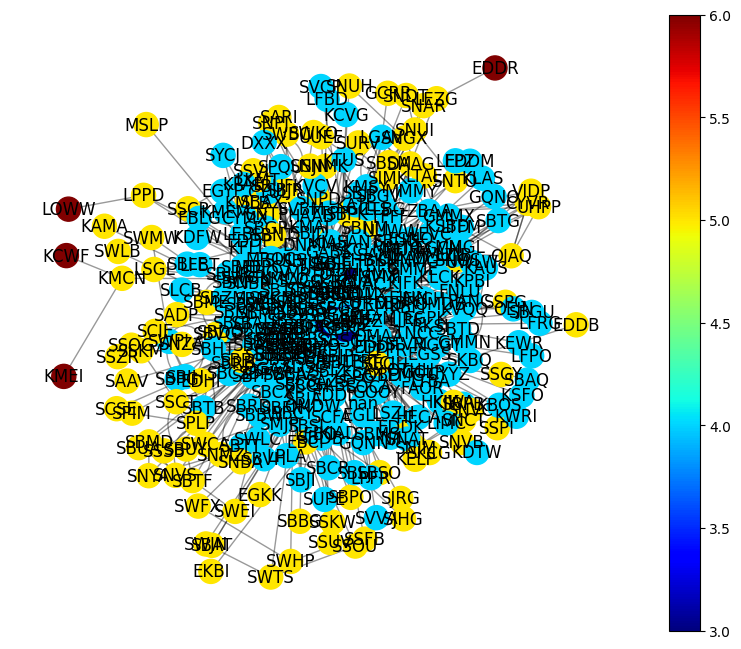

In [10]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

# layout position
pos = nx.spring_layout(G_2019,seed=123456789,k=0.3)
# color of nodes based on eccentricity
color = list(dict(nx.eccentricity(G_2019)).values())

# draw edges
nx.draw_networkx_edges(G_2019,
                       pos=pos,
                       alpha=0.4, ax=ax)

# draw nodes
nodes = nx.draw_networkx_nodes(G_2019,
                 pos=pos,
                 node_color=color,
                 cmap=plt.cm.jet,ax=ax)

# draw labels
nx.draw_networkx_labels(G_2019, pos=pos,
                        font_color='black', ax=ax)


plt.axis("off")
plt.colorbar(nodes)
plt.savefig('eccentricity.png', transparent=True,dpi=300)
plt.show()

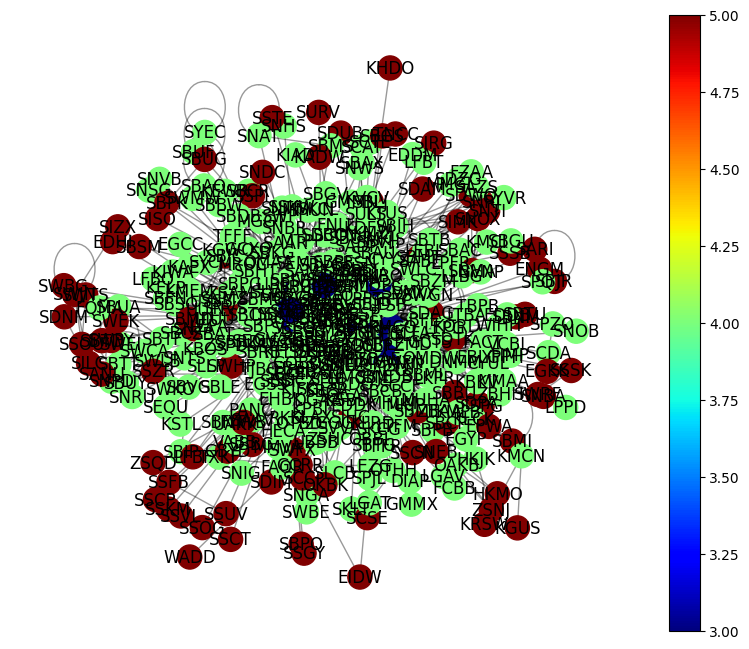

In [11]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

# layout position
pos = nx.spring_layout(G_2020,seed=123456789,k=0.3)
# color of nodes based on eccentricity
color = list(dict(nx.eccentricity(G_2020)).values())

# draw edges
nx.draw_networkx_edges(G_2020,
                       pos=pos,
                       alpha=0.4, ax=ax)

# draw nodes
nodes = nx.draw_networkx_nodes(G_2020,
                 pos=pos,
                 node_color=color,
                 cmap=plt.cm.jet,ax=ax)

# draw labels
nx.draw_networkx_labels(G_2020, pos=pos,
                        font_color='black', ax=ax)


plt.axis("off")
plt.colorbar(nodes)
plt.savefig('eccentricity.png', transparent=True,dpi=300)
plt.show()

>A excentricidade trata da maior distância entre 2 nós conectados. Ou seja, quão maior é o número de conexões entre um aeroporto para seus destinos.

>O diâmetro de um grafo é a sua maior excentricidade, e para o caso em estudo seria de 4.

In [12]:
# Diametro de uma rede complexa

print("Diameter of network (2019): {}".format(nx.diameter(G_2019)))

# Whom are in the diamter
print([k for k, v in nx.eccentricity(G_2019).items() if v == nx.diameter(G_2019)])

Diameter of network (2019): 6
['KMEI', 'KCWF', 'EDDR', 'LOWW']


In [13]:
# Diametro de uma rede complexa

print("Diameter of network (2020): {}".format(nx.diameter(G_2019)))

# Whom are in the diamter
print([k for k, v in nx.eccentricity(G_2020).items() if v == nx.diameter(G_2020)])

Diameter of network (2020): 6
['SJRG', 'SWBG', 'SSCP', 'SSSB', 'SDTK', 'SNOX', 'SNVS', 'SSPI', 'SWTS', 'SSGY', 'SSKM', 'SBMI', 'SDNM', 'SBBU', 'SIZX', 'SBTU', 'SWHP', 'SBCP', 'SIMK', 'SBPK', 'SSFB', 'SSPG', 'SSUV', 'SNEB', 'SSTE', 'SNBA', 'SWFX', 'SBUG', 'SSCN', 'SSCT', 'SILC', 'SWJN', 'SWEK', 'SBPO', 'SBBG', 'SWPY', 'SNDC', 'SNMZ', 'SBJR', 'SBMT', 'SNYA', 'SDIM', 'SBLJ', 'SDUB', 'SBMD', 'SBME', 'SBTD', 'SNTI', 'SSZR', 'SBSM', 'SDAG', 'SNMA', 'SSOG', 'SBNM', 'SSVL', 'SURV', 'SBJC', 'SJHG', 'SSOU', 'SDWQ', 'SNRJ', 'SISO', 'SDPA', 'SWRF', 'SSSK', 'SDAM', 'TNCC', 'EDHI', 'KRSW', 'ZSQD', 'KGUS', 'GBYD', 'KADW', 'SCSE', 'SARI', 'SCCI', 'ZSNJ', 'HKMO', 'EPWA', 'EGKK', 'GCRR', 'LFBF', 'EIDW', 'SBGS', 'ENGM', 'OKBK', 'SANU', 'WADD', 'KHDO', 'FYWB']


A periferia de um grafo, seria o conjunto de todos os nós cujo a excentricidade é igual ao diâmetro, isto é, seriam os aeroportos comumente de mais difícil acesso.

In [14]:
nx.periphery(G_2019)

['KMEI', 'KCWF', 'EDDR', 'LOWW']

O raio de um grafo é sua menor excentricidade, no estudo em questão, seria 2. Já o centro é o conjunto de nós que sua excentricidade é igual ao raio. Os aeroportos no centro, seriam aqueles de mais fácil acesso.

In [15]:
print("Radious of Network(2019): {}".format(nx.radius(G_2019)))
print([k for k, v in nx.eccentricity(G_2019).items() if v == nx.radius(G_2019)])

Radious of Network(2019): 3
['SBBR', 'SBRF', 'SBKP', 'SBGR', 'SBFZ', 'KMIA']


_____________________________________________________________________

## Degree Centrality

A análise utilizando a métrica de Degree Centrality atribui uma pontuação de importância com base simplesmente no número de links mantidos por cada nó.

O que isso nos diz: quantas conexões diretas de “um salto” cada nó tem para outros nós na rede.

Podemos utilizar para localizar nós muito conectados, indivíduos populares, indivíduos que provavelmente possuem a maioria das informações ou indivíduos que podem se conectar rapidamente com a rede mais ampla.

Um pouco mais de detalhe: a Degree Centrality é a medida mais simples de conectividade do nó. Às vezes, é útil observar o grau de entrada (número de links de entrada) e o grau de saída (número de links de saída) como medidas distintas, por exemplo, ao observar dados transacionais ou atividade da conta.

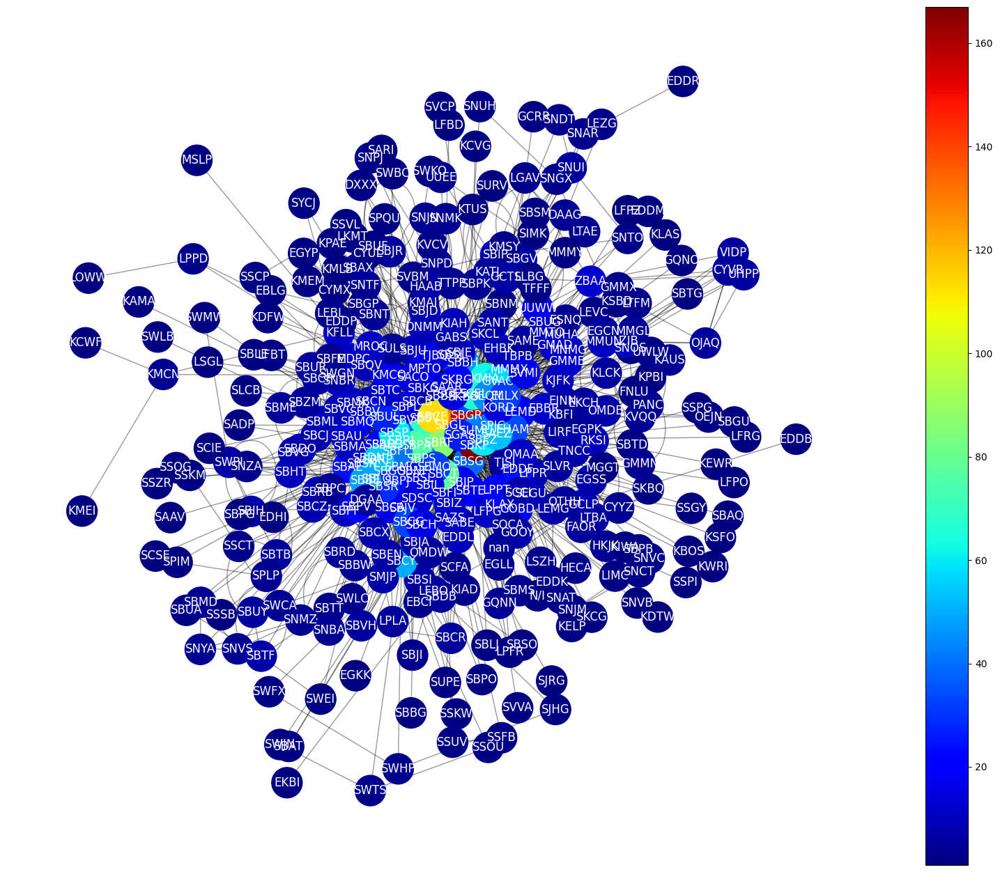

In [16]:
# the degree of network(g)
fig, ax = plt.subplots(1,1,figsize=(20,16))

# layout position
pos = nx.spring_layout(G_2019,seed=123456789,k=0.3)
# color of nodes
color = list(dict(nx.degree(G_2019)).values())

# draw edges
nx.draw_networkx_edges(G_2019,
                       pos=pos,
                       alpha=0.4, ax=ax)

# draw nodes
nodes = nx.draw_networkx_nodes(G_2019,
                 pos=pos,
                 node_size=1000,
                 node_color=color,
                 cmap=plt.cm.jet,ax=ax)

# draw labels
nx.draw_networkx_labels(G_2019, pos=pos,
                        font_color='white', ax=ax)


plt.axis("off")
plt.colorbar(nodes)
plt.savefig('degree.png', transparent=True,dpi=300)
plt.show()

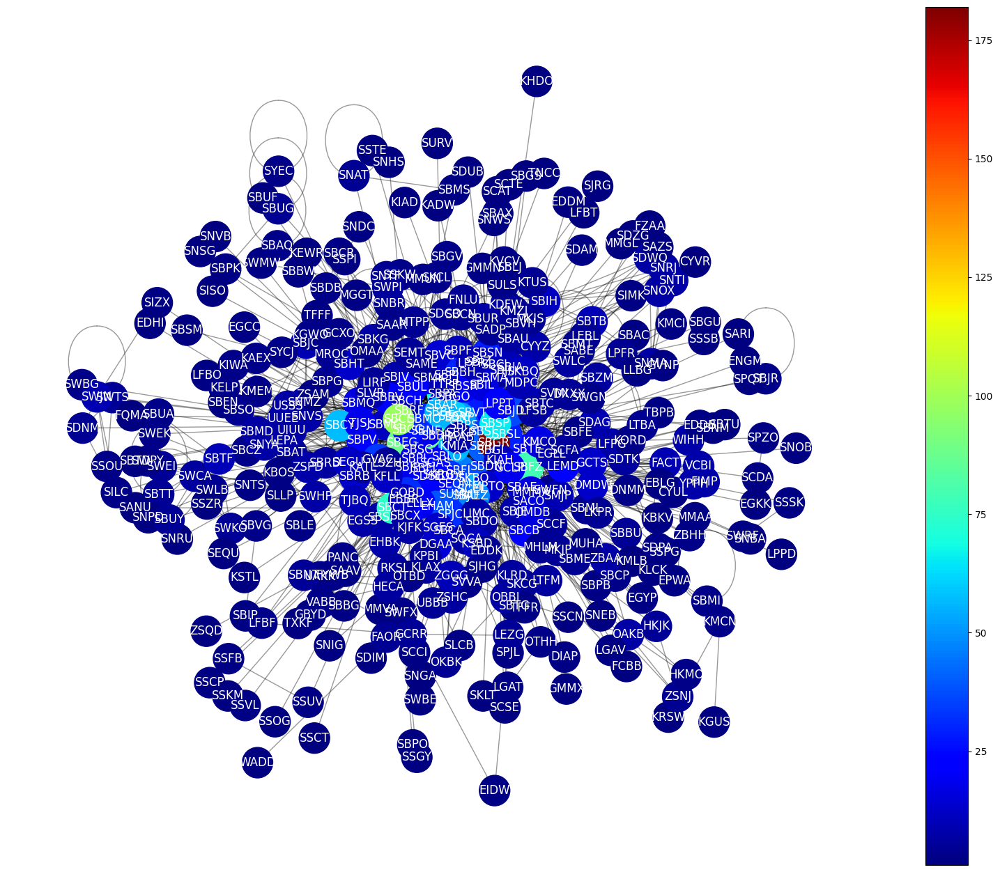

In [17]:
# the degree of network(g)
fig, ax = plt.subplots(1,1,figsize=(20,16))

# layout position
pos = nx.spring_layout(G_2020,seed=123456789,k=0.3)
# color of nodes
color = list(dict(nx.degree(G_2020)).values())

# draw edges
nx.draw_networkx_edges(G_2020,
                       pos=pos,
                       alpha=0.4, ax=ax)

# draw nodes
nodes = nx.draw_networkx_nodes(G_2020,
                 pos=pos,
                 node_size=1000,
                 node_color=color,
                 cmap=plt.cm.jet,ax=ax)

# draw labels
nx.draw_networkx_labels(G_2020, pos=pos,
                        font_color='white', ax=ax)


plt.axis("off")
plt.colorbar(nodes)
plt.savefig('degree.png', transparent=True,dpi=300)
plt.show()

## Betweenness centrality

A análise utilizando a métrica de Betweenness centrality mede o número de vezes que um nó se encontra no caminho mais curto entre outros nós.

O que isso nos diz: esta medida mostra quais nós são “pontes” entre os nós em uma rede. Ele faz isso identificando todos os caminhos mais curtos e, em seguida, contando quantas vezes cada nó cai em um.

Quando usar: para encontrar os indivíduos que influenciam o fluxo em um sistema.

Um pouco mais detalhes: a Betweenness centrality é útil para analisar a dinâmica da comunicação, mas deve ser usada com cuidado. Uma alta contagem de intermediação pode indicar que alguém detém autoridade sobre clusters díspares em uma rede ou apenas que está na periferia de ambos os clusters.

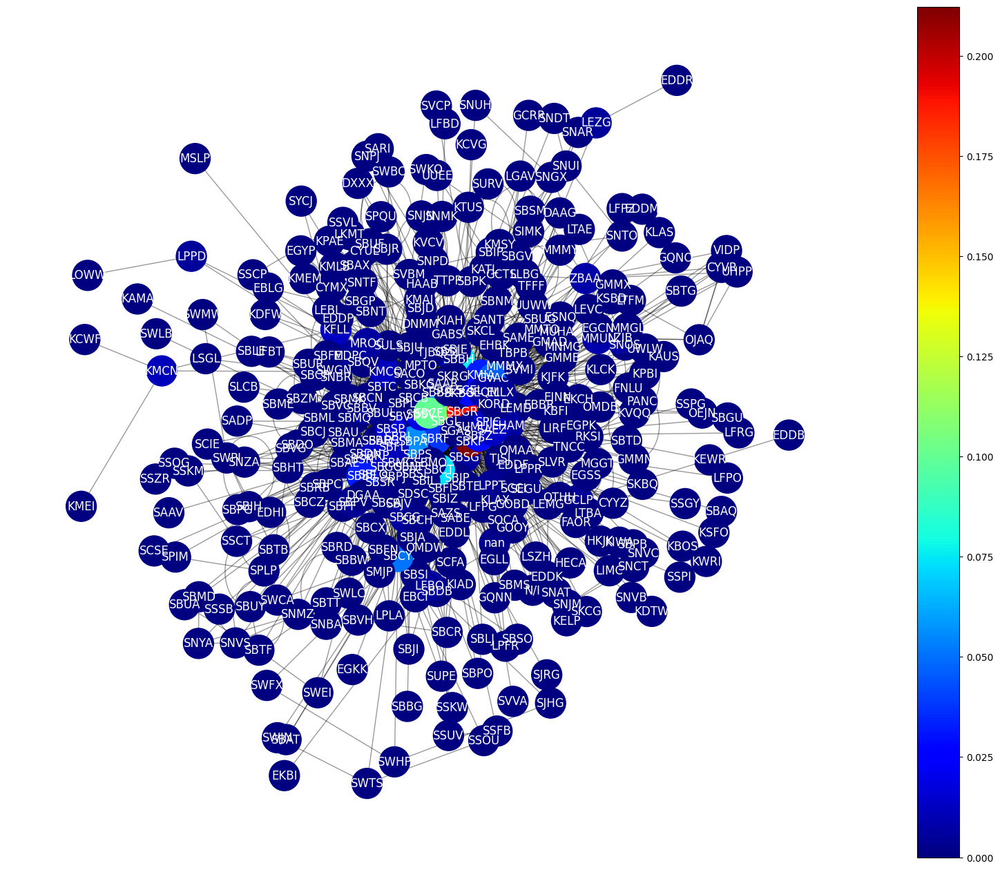

In [18]:
# the betwenness centrality of network(g)
fig, ax = plt.subplots(1,1,figsize=(20,16))

# layout position
pos = nx.spring_layout(G_2019,seed=123456789,k=0.3)
# color of nodes
color = list(dict(nx.betweenness_centrality(G_2019)).values())

# draw edges
nx.draw_networkx_edges(G_2019,
                       pos=pos,
                       alpha=0.4, ax=ax)

# draw nodes
nodes = nx.draw_networkx_nodes(G_2019,
                 pos=pos,
                 node_size=1000,
                 node_color=color,
                 cmap=plt.cm.jet,
                 ax=ax)

# draw labels
nx.draw_networkx_labels(G_2019, pos=pos,
                        font_color='white', ax=ax)


plt.axis("off")
plt.colorbar(nodes)
plt.savefig('betweenness_centrality.png', transparent=True,dpi=600)
plt.show()

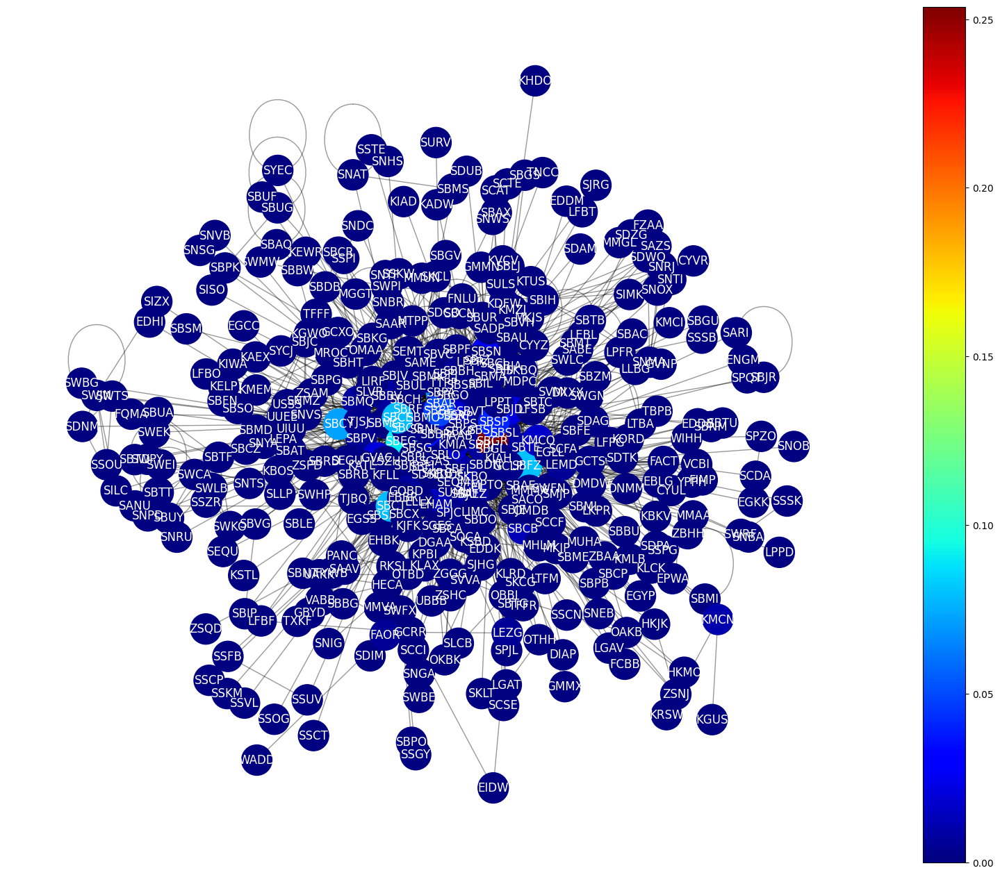

In [19]:
# the betwenness centrality of network(g)
fig, ax = plt.subplots(1,1,figsize=(20,16))

# layout position
pos = nx.spring_layout(G_2020,seed=123456789,k=0.3)
# color of nodes
color = list(dict(nx.betweenness_centrality(G_2020)).values())

# draw edges
nx.draw_networkx_edges(G_2020,
                       pos=pos,
                       alpha=0.4, ax=ax)

# draw nodes
nodes = nx.draw_networkx_nodes(G_2020,
                 pos=pos,
                 node_size=1000,
                 node_color=color,
                 cmap=plt.cm.jet,
                 ax=ax)

# draw labels
nx.draw_networkx_labels(G_2020, pos=pos,
                        font_color='white', ax=ax)


plt.axis("off")
plt.colorbar(nodes)
plt.savefig('betweenness_centrality2020.png', transparent=True,dpi=600)
plt.show()

## Análise Bivariada

A análise bivariada é realizada para encontrar a relação entre cada variável no conjunto de dados e a variável alvo de interesse (ou) usando 2 variáveis e encontrando a relação entre elas. No caso específico vamos utilizar as 2 métricas já citadas anteriormente, Betweenness Centrality por Degree Centrality.

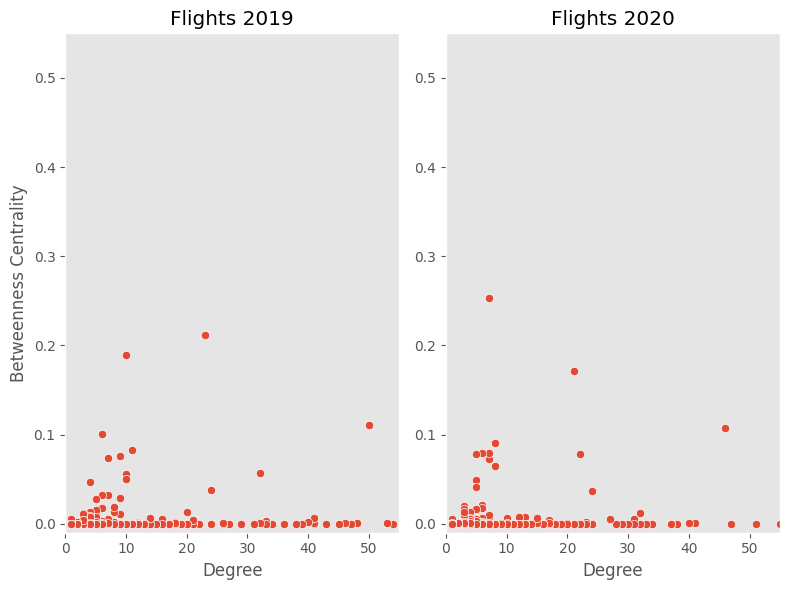

In [20]:
import seaborn as sns
plt.style.use("ggplot")
#plt.style.use("default")

fig, ax = plt.subplots(1,2,figsize=(8,6))

# degree sequence
degree_sequence = sorted([d for n, d in G_2019.degree()], reverse=True) 
degree_sequence2 = sorted([d for n, d in G_2020.degree()], reverse=True)  

sns.scatterplot(x=degree_sequence,y=[v for k,v in nx.betweenness_centrality(G_2019).items()],ax=ax[0])
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Betweenness Centrality")
ax[0].set_title("Flights 2019")
ax[0].set_xlim(0,55)
ax[0].set_ylim(-0.01,0.55)
ax[0].grid(False)

sns.scatterplot(x=degree_sequence2,y=[v for k,v in nx.betweenness_centrality(G_2020).items()],ax=ax[1])
ax[1].set_xlabel("Degree")
ax[1].set_title("Flights 2020")
ax[1].set_xlim(0,55)
ax[1].set_ylim(-0.01,0.55)
ax[1].grid(False)

plt.tight_layout()
plt.savefig('degree_vs_betweenness.png', transparent=True,dpi=600,bbox_inches="tight")
plt.show()

> Para uma visualização na qual possamos comparar os resultados gerados utilizamos a biblioteca Seaborn, a qual cria um grid com os gráficos gerados. Na diagonal principal, temos um kdeplot, que é basicamente o pdf da nossa variável de estudo. No caso temos o pdf do betweeness centrality e do degree cetrality. Na parte superior a direita, geramos um gráfico de dispersão, e na parte inferior esquerda temos um kdplot multivariável.

In [21]:
bc_2019 = pd.Series(nx.betweenness_centrality(G_2019))
dc_2019 = pd.Series(nx.degree_centrality(G_2019))

df_2019 = pd.DataFrame.from_dict({"Betweenness": bc_2019,
                                 "Degree": dc_2019})

df_2019.reset_index(inplace=True,drop=True)
df_2019.head()

   Betweenness    Degree
0     0.003193  0.111732
1     0.000055  0.053073
2     0.000018  0.025140
3     0.000000  0.002793
4     0.000160  0.013966

Pelos resultados podemos observar que os 2 métodos analisados possuem uma cauda longa, ou seja uma assimetria positiva. Isso quer dizer que existe uma grande quantidade de vértices, que forma o pico, com baixo betweeness, e uma grande quantidade de vértices próximo de zero e com alto betweeness.

No gráfico de dispersão, temos a análise da métrica betweeness centrality e do degree cetrality. Podemos observar que quando aumentarmos o degree, não necessariamente o betweeness aumenta.

Na perspectiva inferior, temos uma visão mais condensada do gráfico superior, porem utilizando o kde. Na qual temos a maior densidade sendo a parte mais branca (utilizamos o Reds_r para inverter).

## Probability Density Function (PDF)

A densidade de probabilidade é a relação entre as observações e sua probabilidade. Alguns resultados de uma variável aleatória terão baixa densidade de probabilidade e outros resultados terão uma alta densidade de probabilidade.

A forma geral da densidade de probabilidade é referida como uma distribuição de probabilidade, e o cálculo de probabilidades para resultados específicos de uma variável aleatória é realizado por uma função de densidade de probabilidade, ou PDF.

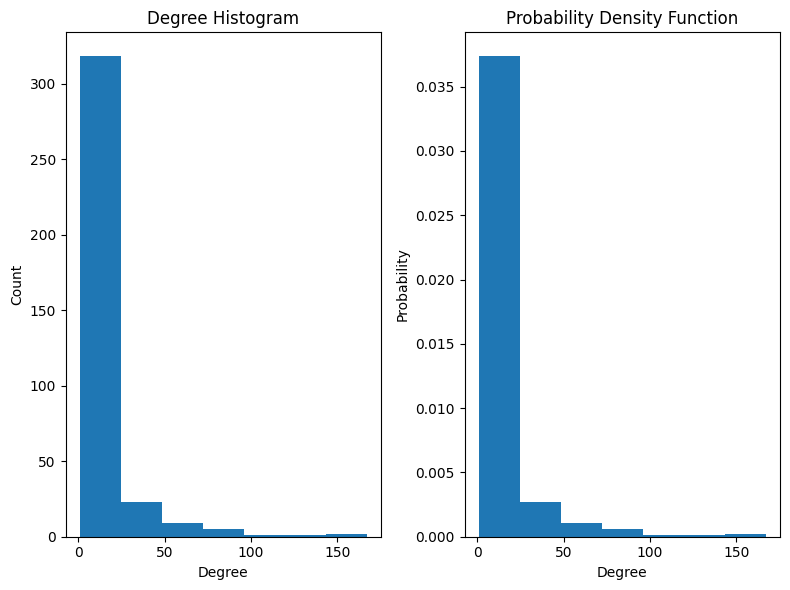

In [22]:
plt.style.use("default")
# degree sequence
degree_sequence = sorted([d for n, d in G_2019.degree()], reverse=True)  

fig, ax = plt.subplots(1,2,figsize=(8,6))

# all_data has information about degree_sequence and the width of each bin
all_data_2019 = ax[0].hist(degree_sequence,bins=7)
ax[1].hist(degree_sequence,bins=7,density=True)

ax[0].set_title("Degree Histogram")
ax[0].set_ylabel("Count")
ax[0].set_xlabel("Degree")

ax[1].set_title("Probability Density Function")
ax[1].set_ylabel("Probability")
ax[1].set_xlabel("Degree")

plt.tight_layout()
plt.show()

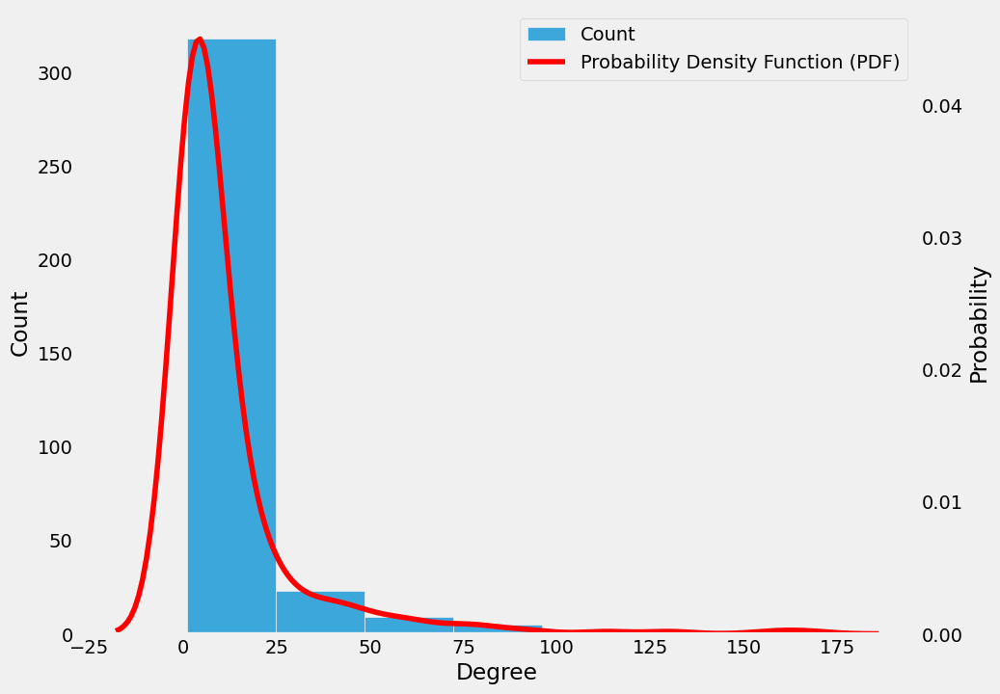

In [23]:
plt.style.use("fivethirtyeight")
#plt.style.use("default")

fig, ax = plt.subplots(1,1,figsize=(10,8))

sns.histplot(degree_sequence,bins=7,label="Count",ax=ax)
ax2 = ax.twinx()
sns.kdeplot(degree_sequence,color='r',label="Probability Density Function (PDF)",ax=ax2)

# ask matplotlib for the plotted objects and their labels
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)

ax.grid(False)
ax2.grid(False)
ax.set_xlabel("Degree")
ax2.set_ylabel("Probability")

plt.savefig('probability_density_function.png', transparent=True,dpi=600,bbox_inches="tight")
plt.show()

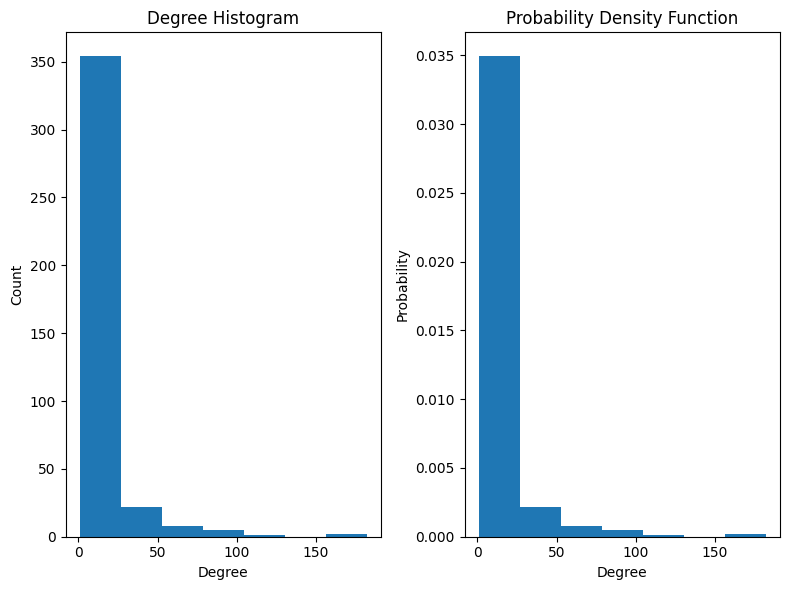

In [24]:
plt.style.use("default")
# degree sequence
degree_sequence = sorted([d for n, d in G_2020.degree()], reverse=True)  

fig, ax = plt.subplots(1,2,figsize=(8,6))

# all_data has information about degree_sequence and the width of each bin
all_data_2020 = ax[0].hist(degree_sequence,bins=7)
ax[1].hist(degree_sequence,bins=7,density=True)

ax[0].set_title("Degree Histogram")
ax[0].set_ylabel("Count")
ax[0].set_xlabel("Degree")

ax[1].set_title("Probability Density Function")
ax[1].set_ylabel("Probability")
ax[1].set_xlabel("Degree")

plt.tight_layout()
plt.show()

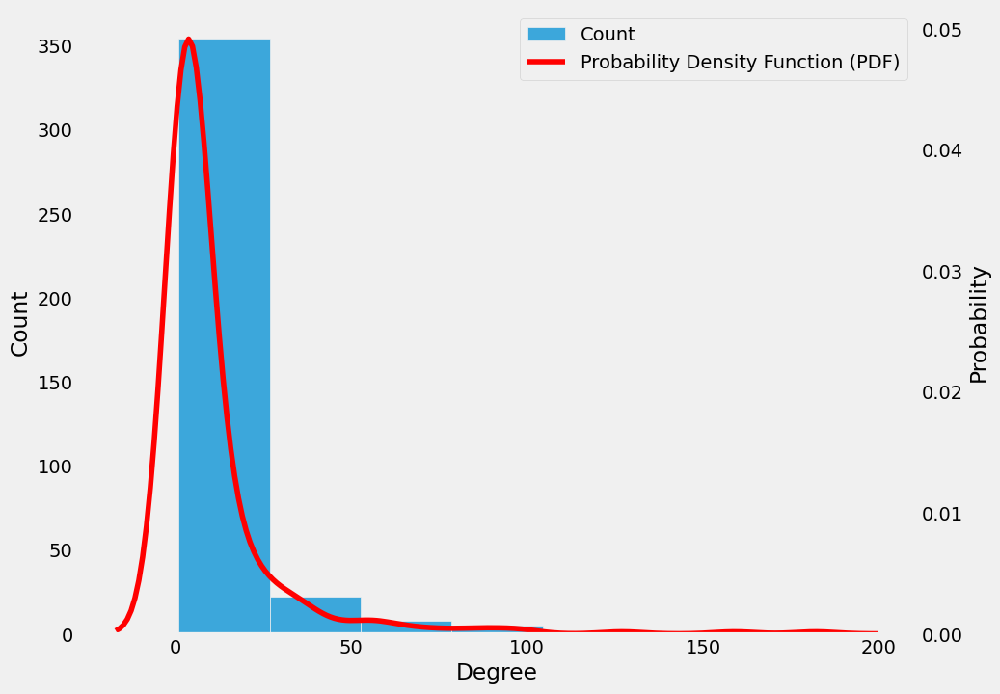

In [25]:
plt.style.use("fivethirtyeight")
#plt.style.use("default")

fig, ax = plt.subplots(1,1,figsize=(10,8))

sns.histplot(degree_sequence,bins=7,label="Count",ax=ax)
ax2 = ax.twinx()
sns.kdeplot(degree_sequence,color='r',label="Probability Density Function (PDF)",ax=ax2)

# ask matplotlib for the plotted objects and their labels
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)

ax.grid(False)
ax2.grid(False)
ax.set_xlabel("Degree")
ax2.set_ylabel("Probability")

plt.savefig('probability_density_function.png', transparent=True,dpi=600,bbox_inches="tight")
plt.show()

Podemos observar nos 2, tanto em 2019 como em 2020, que a maior quantidades de nós possui de 1 a 10 conexões. O PDF utilizado é chamado de KDE (Kernel density estimation), e é representado pela curva em vermelho. Podemos concluir que 4% dos nós possuem 10 conexões, e que menos de 1% dos aeroportos possuem 20 a 80 conexões.

## Core Decomposition

In [26]:
# Removing self loops

G_2019.remove_edges_from(nx.selfloop_edges(G_2019))

# k-core of a network

set([v for k, v in nx.core_number(G_2019).items()])

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18}

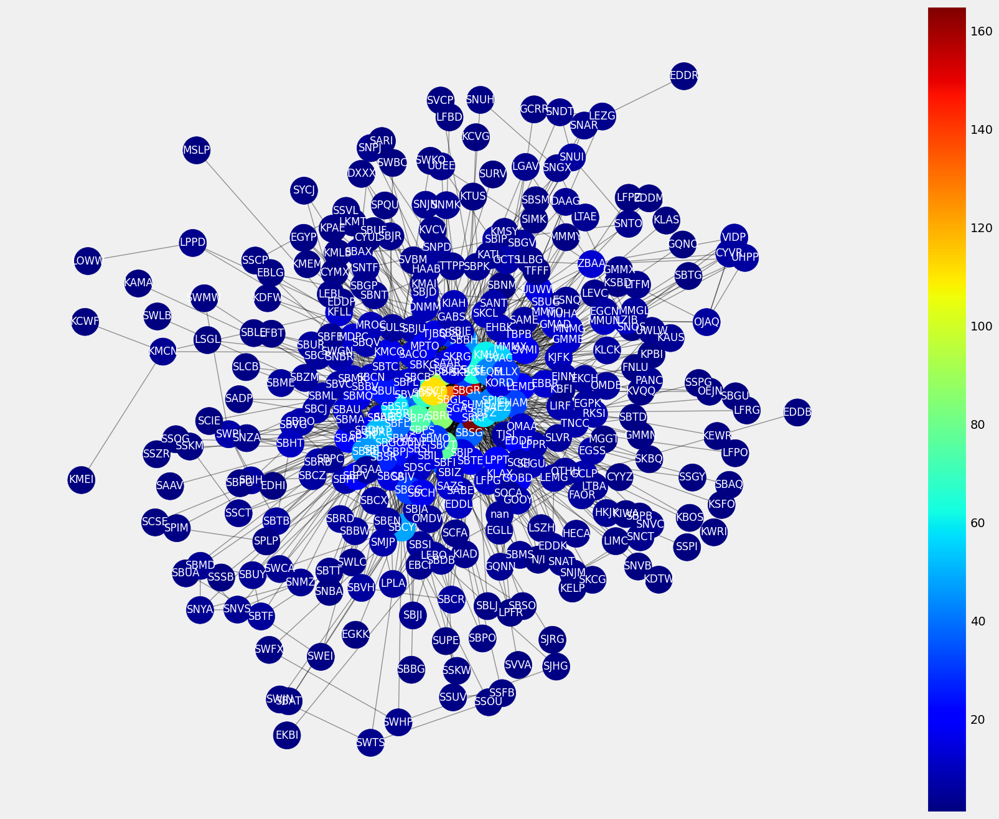

In [27]:
# the degree of network(g2)
fig, ax = plt.subplots(1,1,figsize=(20,16))

# layout position 
pos_2019 = nx.spring_layout(G_2019,seed=123456789,k=0.3)
# color of nodes
color = list(dict(nx.degree(G_2019)).values())

# draw edges
nx.draw_networkx_edges(G_2019,
                       pos=pos_2019,
                       alpha=0.4, ax=ax)

# draw nodes
nodes_2019 = nx.draw_networkx_nodes(G_2019,
                 pos=pos_2019,
                 node_size=1000,
                 node_color=color,
                 cmap=plt.cm.jet,ax=ax)

# draw labels
nx.draw_networkx_labels(G_2019, pos=pos_2019,
                        font_color='white', ax=ax)


plt.axis("off")
plt.colorbar(nodes_2019)
plt.savefig('flights_2019.png', transparent=True,dpi=600)
plt.show()

In [28]:
# Removing self loops

G_2020.remove_edges_from(nx.selfloop_edges(G_2020))

# k-core of a network

set([v for k, v in nx.core_number(G_2020).items()])

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18}

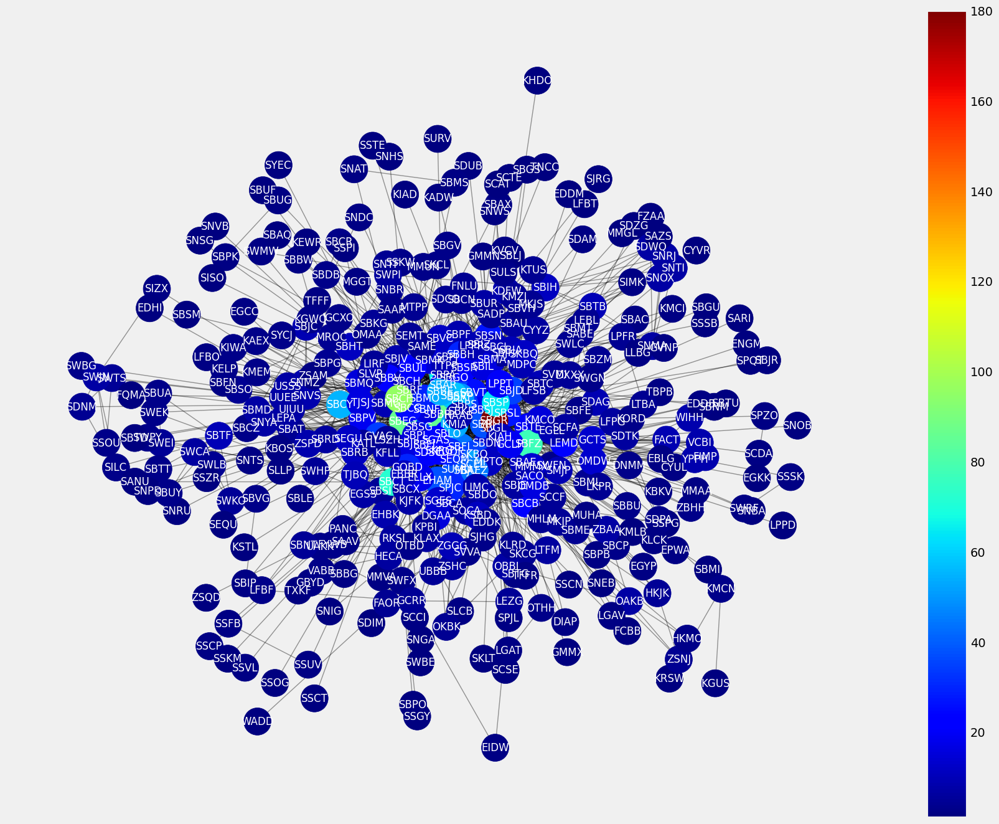

In [29]:
# the degree of network(g2)
fig, ax = plt.subplots(1,1,figsize=(20,16))

# layout position 
pos_2020 = nx.spring_layout(G_2020,seed=123456789,k=0.3)
# color of nodes
color = list(dict(nx.degree(G_2020)).values())

# draw edges
nx.draw_networkx_edges(G_2020,
                       pos=pos_2020,
                       alpha=0.4, ax=ax)

# draw nodes
nodes_2020 = nx.draw_networkx_nodes(G_2020,
                 pos=pos_2020,
                 node_size=1000,
                 node_color=color,
                 cmap=plt.cm.jet,ax=ax)

# draw labels
nx.draw_networkx_labels(G_2020, pos=pos_2020,
                        font_color='white', ax=ax)


plt.axis("off")
plt.colorbar(nodes_2020)
plt.savefig('flights_2020.png', transparent=True,dpi=600)
plt.show()

NameError: name 'G_2019_core_17' is not defined

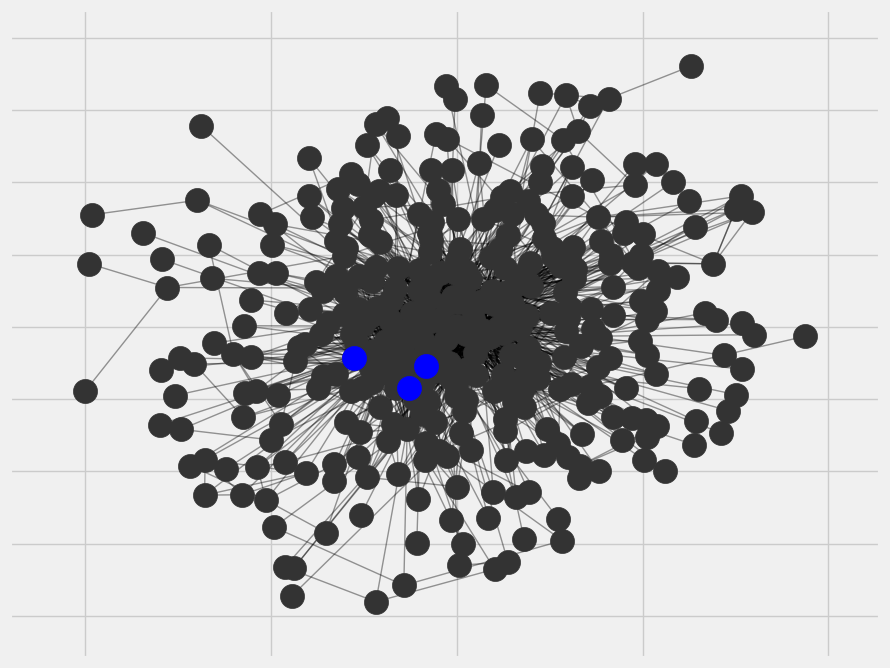

In [30]:
import matplotlib.patches as mpatches
# the degree of network(g2)
fig, ax = plt.subplots(1,1,figsize=(10,8))

# Find k-cores
G_2019_core_16 = nx.k_shell(G_2019, 16)
G_2019_core_18 = nx.k_core(G_2019, 18)

# layout position
pos = nx.spring_layout(G_2019,seed=123456789,k=0.3)

# draw edges
nx.draw_networkx_edges(G_2019,
                       pos=pos,
                       alpha=0.4, ax=ax)

# draw nodes
nodes = nx.draw_networkx_nodes(G_2019,
                 pos=pos,
                 node_color="#333333")

# draw nodes
nodes = nx.draw_networkx_nodes(G_2019_core_16,
                 pos=pos,
                 node_color="blue")

nodes = nx.draw_networkx_nodes(G_2019_core_17,
                 pos=pos,
                 node_color="red")

# static legend
red_patch = mpatches.Patch(color='red', label='18-core')
blue_patch = mpatches.Patch(color='blue', label='16-shell')
plt.legend(handles=[red_patch,blue_patch])

plt.axis("off")
plt.savefig('k-core_flights_2019.png', transparent=True,dpi=600)
plt.show()

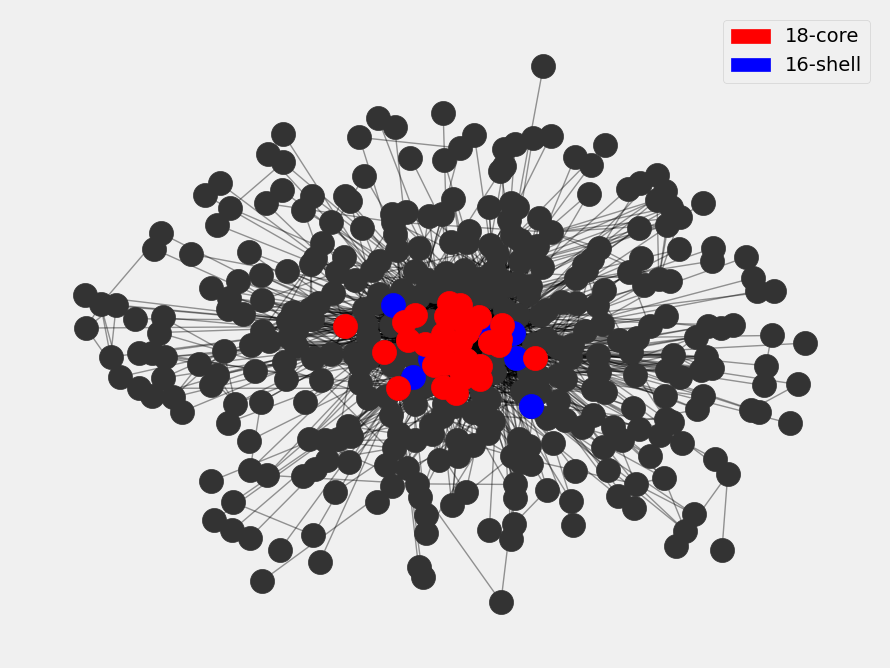

In [31]:
import matplotlib.patches as mpatches
# the degree of network(g2)
fig, ax = plt.subplots(1,1,figsize=(10,8))

# Find k-cores
G_2020_core_16 = nx.k_shell(G_2020, 16)
G_2020_core_17 = nx.k_core(G_2020, 18)

# layout position
pos = nx.spring_layout(G_2020,seed=123456789,k=0.3)

# draw edges
nx.draw_networkx_edges(G_2020,
                       pos=pos,
                       alpha=0.4, ax=ax)

# draw nodes
nodes = nx.draw_networkx_nodes(G_2020,
                 pos=pos,
                 node_color="#333333")

# draw nodes
nodes = nx.draw_networkx_nodes(G_2020_core_16,
                 pos=pos,
                 node_color="blue")

nodes = nx.draw_networkx_nodes(G_2020_core_17,
                 pos=pos,
                 node_color="red")

# static legend
red_patch = mpatches.Patch(color='red', label='18-core')
blue_patch = mpatches.Patch(color='blue', label='16-shell')
plt.legend(handles=[red_patch,blue_patch])

plt.axis("off")
plt.savefig('k-core_flights_2020.png', transparent=True,dpi=600)
plt.show()

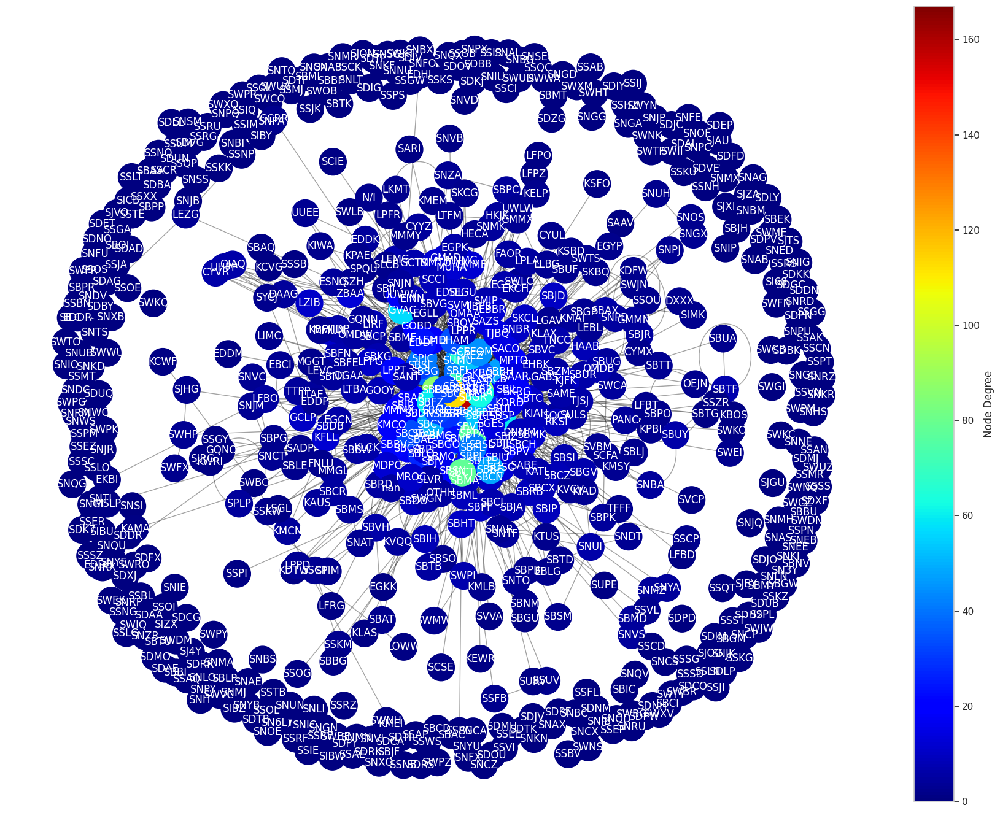

In [32]:
#Creating graph
G_2019 = nx.Graph()
for index, row in airports_coordenates_db.iterrows():
  G_2019.add_node(row['airport_code'], airport_name=row['airport_name'], lat=row['lat'], lon=row['lon'], city=row['city'], state=row['state'])

for index, row in traffic_db_2019.iterrows():
  G_2019.add_edge(row['airport_origin_code'], row['airport_destination_code'])

for n, d in G_2019.nodes(data=True):
    G_2019.nodes[n]["class"] = G_2019.degree(n)

G_2019.number_of_nodes()
# Configurações Seaborn
sns.set(style='whitegrid')

# Layout position
pos = nx.spring_layout(G_2019, seed=123456789, k=0.3)

# Color of nodes
color = list(dict(nx.degree(G_2019)).values())

# Configurações do plot
fig, ax = plt.subplots(figsize=(20, 16))
nx.draw_networkx_edges(G_2019, pos=pos, alpha=0.4, ax=ax)
nodes = nx.draw_networkx_nodes(G_2019, pos=pos, node_size=1000, node_color=color, cmap=plt.cm.jet, ax=ax)
nx.draw_networkx_labels(G_2019, pos=pos, font_color='white', ax=ax)

# Adiciona uma barra de cores
cbar = plt.colorbar(nodes)
cbar.set_label('Node Degree')

plt.axis("off")
plt.savefig('degree_seaborn.png', transparent=True, dpi=300)
plt.show()

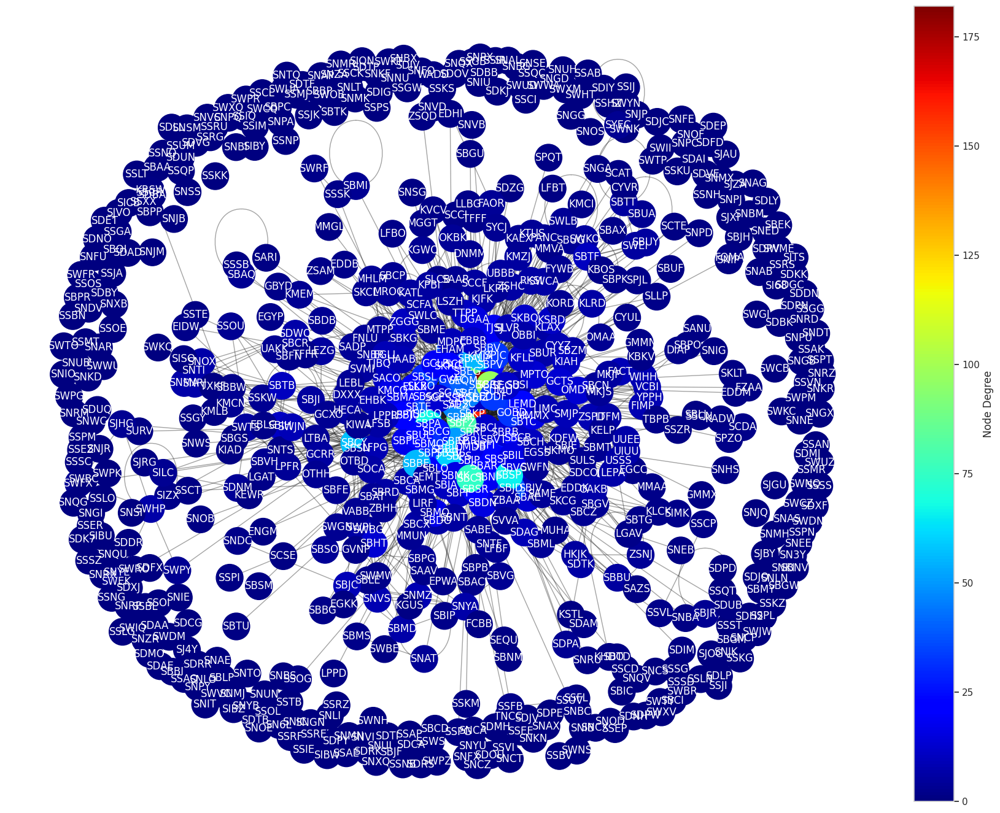

In [33]:
#Creating graph
G_2020 = nx.Graph()
for index, row in airports_coordenates_db.iterrows():
  G_2020.add_node(row['airport_code'], airport_name=row['airport_name'], lat=row['lat'], lon=row['lon'], city=row['city'], state=row['state'])

for index, row in traffic_db_2020.iterrows():
  G_2020.add_edge(row['airport_origin_code'], row['airport_destination_code'])

for n, d in G_2020.nodes(data=True):
    G_2020.nodes[n]["class"] = G_2019.degree(n)

G_2020.number_of_nodes()

# Configurações Seaborn
sns.set(style='whitegrid')

# Layout position
pos = nx.spring_layout(G_2020, seed=123456789, k=0.3)

# Color of nodes
color = list(dict(nx.degree(G_2020)).values())

# Configurações do plot
fig, ax = plt.subplots(figsize=(20, 16))
nx.draw_networkx_edges(G_2020, pos=pos, alpha=0.4, ax=ax)
nodes = nx.draw_networkx_nodes(G_2020, pos=pos, node_size=1000, node_color=color, cmap=plt.cm.jet, ax=ax)
nx.draw_networkx_labels(G_2020, pos=pos, font_color='white', ax=ax)

# Adiciona uma barra de cores
cbar = plt.colorbar(nodes)
cbar.set_label('Node Degree')

plt.axis("off")
plt.savefig('degree_seaborn_2020.png', transparent=True, dpi=300)
plt.show()

_______________________________________________________________________
_______________________________________________________________________
_______________________________________________________________________
_______________________________________________________________________

In [45]:
import pandas as pd

# Calcular a quantidade de nós e arestas para G_2019 e G_2020
nodes_2019 = G_2019.number_of_nodes()
edges_2019 = G_2019.number_of_edges()

nodes_2020 = G_2020.number_of_nodes()
edges_2020 = G_2020.number_of_edges()

# Criar um DataFrame com os indicadores
data = {
    'Ano': [2019, 2020],
    'Quantidade de Nós': [nodes_2019, nodes_2020],
    'Quantidade de Arestas': [edges_2019, edges_2020]
}

indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)

    Ano  Quantidade de Nós  Quantidade de Arestas
0  2019                359                   2131
1  2020                392                   2076


In [46]:
# Calcular o grau de cada nó
degrees_2019 = dict(G_2019.degree())
degrees_2020 = dict(G_2020.degree())

# Calcular o Degree Centrality médio
dc_mean_2019 = sum(degrees_2019.values()) / len(degrees_2019)
dc_mean_2020 = sum(degrees_2020.values()) / len(degrees_2020)

# Criar um DataFrame com os indicadores
data = {
   'Ano': [2019, 2020],
   'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
   'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
   'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020]
}

# Criar DataFrame
indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio
0  2019                359                   2131                11.871866
1  2020                392                   2076                10.591837


In [47]:
# Calcular o coeficiente de agrupamento de cada nó
clustering_coefficients_2019 = nx.clustering(G_2019)
clustering_coefficients_2020 = nx.clustering(G_2020)

# Calcular o coeficiente de agrupamento médio
clustering_coefficient_mean_2019 = sum(clustering_coefficients_2019.values()) / len(clustering_coefficients_2019)
clustering_coefficient_mean_2020 = sum(clustering_coefficients_2020.values()) / len(clustering_coefficients_2020)

# Criar um DataFrame com os indicadores
data = {
   'Ano': [2019, 2020],
   'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
   'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
   'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
   'Coeficiente de Agrupamento Médio': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020]
}

indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)

    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio  
0                          0.683318  
1                          0.634130  


In [48]:
# Calcular o coeficiente de agrupamento de cada nó
clustering_coefficients_2019 = nx.clustering(G_2019)
clustering_coefficients_2020 = nx.clustering(G_2020)

# Calcular o coeficiente de agrupamento médio
clustering_coefficient_mean_2019 = sum(clustering_coefficients_2019.values()) / len(clustering_coefficients_2019)
clustering_coefficient_mean_2020 = sum(clustering_coefficients_2020.values()) / len(clustering_coefficients_2020)

# Criar um DataFrame com os indicadores
data = {
   'Ano': [2019, 2020],
   'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
   'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
   'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
   'Coeficiente de Agrupamento Médio (C)': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020]
}

indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio (C)  
0                              0.683318  
1                              0.634130  


In [49]:
# Calcular o comprimento de caminho médio
shortest_path_length_2019 = nx.average_shortest_path_length(G_2019)
shortest_path_length_2020 = nx.average_shortest_path_length(G_2020)

# Criar um DataFrame com os indicadores
data = {
   'Ano': [2019, 2020],
   'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
   'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
   'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
   'Coeficiente de Agrupamento Médio (C)': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020],
   'Comprimento de Caminho Médio (L)': [shortest_path_length_2019, shortest_path_length_2020]
}

indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)

    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio (C)  Comprimento de Caminho Médio (L)  
0                              0.683318                          2.523475  
1                              0.634130                          2.555809  


In [50]:
# Calcular o comprimento de caminho mínimo
shortest_path_lengths_min_2019 = nx.shortest_path_length(G_2019, weight="weight")
shortest_path_lengths_min_2020 = nx.shortest_path_length(G_2020, weight="weight")

# Criar um DataFrame com os indicadores
data = {
   'Ano': [2019, 2020],
   'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
   'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
   'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
   'Coeficiente de Agrupamento Médio': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020],
   'Comprimento de Caminho Médio': [shortest_path_lengths_2019, shortest_path_lengths_2020],
   'Comprimento de Caminho Mínimo': [shortest_path_lengths_min_2019, shortest_path_lengths_min_2020]
}

indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)

NameError: name 'shortest_path_lengths_2019' is not defined

In [51]:
# Calcular o comprimento de caminho mínimo
shortest_path_lengths_min_2019 = nx.all_pairs_dijkstra_path_length(G_2019, weight="weight")
shortest_path_lengths_min_2020 = nx.all_pairs_dijkstra_path_length(G_2020, weight="weight")

# Extrair os valores dos dicionários
shortest_path_lengths_min_2019_values = [length for node, paths in shortest_path_lengths_min_2019 for length in paths.values()]
shortest_path_lengths_min_2020_values = [length for node, paths in shortest_path_lengths_min_2020 for length in paths.values()]

# Criar um DataFrame com os indicadores
data = {
    'Ano': [2019, 2020],
    'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
    'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
    'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
    'Coeficiente de Agrupamento Médio': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020],
    'Comprimento de Caminho Mínimo': [shortest_path_length_2019, shortest_path_length_2020],
}

# Criar DataFrame
indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio  Comprimento de Caminho Mínimo  
0                          0.683318                       2.523475  
1                          0.634130                       2.555809  


In [52]:
# Calcular o comprimento do caminho mínimo
shortest_path_lengths_min_2019 = nx.all_pairs_dijkstra_path_length(G_2019, weight="weight")
shortest_path_lengths_min_2020 = nx.all_pairs_dijkstra_path_length(G_2020, weight="weight")

# Extrair os valores dos dicionários
shortest_path_lengths_min_2019_values = [length for node, paths in shortest_path_lengths_min_2019 for length in paths.values()]
shortest_path_lengths_min_2020_values = [length for node, paths in shortest_path_lengths_min_2020 for length in paths.values()]

# Calcular o comprimento do caminho máximo
diameter_2019 = nx.diameter(G_2019, weight="weight")
diameter_2020 = nx.diameter(G_2020, weight="weight")

# Criar um DataFrame com os indicadores
data = {
    'Ano': [2019, 2020],
    'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
    'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
    'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
    'Coeficiente de Agrupamento Médio': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020],
    'Comprimento de Caminho Mínimo': [np.mean(shortest_path_lengths_min_2019_values), np.mean(shortest_path_lengths_min_2020_values)],
    'Comprimento de Caminho Máximo': [diameter_2019, diameter_2020]
}

# Criar DataFrame
indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio  Comprimento de Caminho Mínimo  \
0                          0.683318                       2.516445   
1                          0.634130                       2.549289   

   Comprimento de Caminho Máximo  
0                              6  
1                              5  


In [53]:
# Calcular o comprimento de caminho mínimo
shortest_path_lengths_min_2019 = nx.all_pairs_dijkstra_path_length(G_2019, weight="weight")
shortest_path_lengths_min_2020 = nx.all_pairs_dijkstra_path_length(G_2020, weight="weight")

# Extrair os valores dos dicionários
shortest_path_lengths_min_2019_values = [length for node, paths in shortest_path_lengths_min_2019 for length in paths.values()]
shortest_path_lengths_min_2020_values = [length for node, paths in shortest_path_lengths_min_2020 for length in paths.values()]

# Calcular o comprimento do caminho médio
average_shortest_path_length_2019 = np.mean(shortest_path_lengths_min_2019_values)
average_shortest_path_length_2020 = np.mean(shortest_path_lengths_min_2020_values)

# Criar um DataFrame com os indicadores
data = {
    'Ano': [2019, 2020],
    'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
    'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
    'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
    'Coeficiente de Agrupamento Médio': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020],
    'Comprimento de Caminho Mínimo Médio': [average_shortest_path_length_2019, average_shortest_path_length_2020],
    'Comprimento de Caminho Máximo': [diameter_2019, diameter_2020]
}

# Criar DataFrame
indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio  Comprimento de Caminho Mínimo Médio  \
0                          0.683318                             2.516445   
1                          0.634130                             2.549289   

   Comprimento de Caminho Máximo  
0                              6  
1                              5  


In [54]:
# Transpor o DataFrame
indicadores_df_transposed = indicadores_df.transpose()

# Renomear a primeira coluna para 'Indicadores'
indicadores_df_transposed.columns = indicadores_df_transposed.iloc[0]

# Remover a primeira linha
indicadores_df_transposed = indicadores_df_transposed[1:]

# Exibir o DataFrame transposto
print(indicadores_df_transposed)


Ano                                       2019.0       2020.0
Quantidade de Nós                     359.000000   392.000000
Quantidade de Arestas                2131.000000  2076.000000
Degree Centrality Médio                11.871866    10.591837
Coeficiente de Agrupamento Médio        0.683318     0.634130
Comprimento de Caminho Mínimo Médio     2.516445     2.549289
Comprimento de Caminho Máximo           6.000000     5.000000


In [55]:
# Calcular o Components Dynamics Deviation
def components_dynamics_deviation(graph):
    num_nodes = graph.number_of_nodes()
    num_edges = graph.number_of_edges()

    # Inicializar uma lista para armazenar o número de componentes conectados
    components = []

    # Criar cópia do grafo
    temp_graph = graph.copy()

    # Adicionar arestas uma por uma e contar os componentes conectados
    for edge in graph.edges():
        temp_graph.add_edge(edge[0], edge[1])
        num_components = nx.number_connected_components(temp_graph)
        components.append(num_components)

    # Calcular a curva ótima
    optimal_curve = [(i + 1) * (num_nodes / num_edges) for i in range(num_edges)]

    # Calcular o desvio da dinâmica dos componentes para cada ponto na curva
    deviation = [abs(components[i] - optimal_curve[i]) for i in range(num_edges)]

    # Calcular a média aritmética do desvio
    cdd = sum(deviation) / num_edges

    return cdd

# Calcular o Components Dynamics Deviation para G_2019 e G_2020
cdd_2019 = components_dynamics_deviation(G_2019)
cdd_2020 = components_dynamics_deviation(G_2020)

# Adicionar ao DataFrame
indicadores_df['Components Dynamics Deviation'] = [cdd_2019, cdd_2020]

# Exibir o DataFrame atualizado
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio  Comprimento de Caminho Mínimo Médio  \
0                          0.683318                             2.516445   
1                          0.634130                             2.549289   

   Comprimento de Caminho Máximo  Components Dynamics Deviation  
0                              6                     178.586554  
1                              5                     195.096501  


In [56]:
# Calcular a betweenness centrality
betweenness_centrality_2019 = nx.betweenness_centrality(G_2019, weight="weight")
betweenness_centrality_2020 = nx.betweenness_centrality(G_2020, weight="weight")

# Extrair os valores dos dicionários
betweenness_centrality_2019_values = list(betweenness_centrality_2019.values())
betweenness_centrality_2020_values = list(betweenness_centrality_2020.values())

# Criar um DataFrame com os indicadores
data = {
    'Ano': [2019, 2020],
    'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
    'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
    'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
    'Coeficiente de Agrupamento Médio': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020],
    'Comprimento de Caminho Mínimo Médio': [average_shortest_path_length_2019, average_shortest_path_length_2020],
    'Comprimento de Caminho Máximo': [diameter_2019, diameter_2020],
    'Components Dynamics Deviation': [178.586554, 195.096501],
    'Betweenness Centrality': [np.mean(betweenness_centrality_2019_values), np.mean(betweenness_centrality_2020_values)]
}

# Criar DataFrame
indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio  Comprimento de Caminho Mínimo Médio  \
0                          0.683318                             2.516445   
1                          0.634130                             2.549289   

   Comprimento de Caminho Máximo  Components Dynamics Deviation  \
0                              6                     178.586554   
1                              5                     195.096501   

   Betweenness Centrality  
0                0.004275  
1                0.003989  


In [57]:
# Calcular a correlação de grau
degree_correlation_2019 = nx.degree_assortativity_coefficient(G_2019)
degree_correlation_2020 = nx.degree_assortativity_coefficient(G_2020)

# Criar um DataFrame com os indicadores
data = {
    'Ano': [2019, 2020],
    'Quantidade de Nós': [G_2019.number_of_nodes(), G_2020.number_of_nodes()],
    'Quantidade de Arestas': [G_2019.number_of_edges(), G_2020.number_of_edges()],
    'Degree Centrality Médio': [dc_mean_2019, dc_mean_2020],
    'Coeficiente de Agrupamento Médio': [clustering_coefficient_mean_2019, clustering_coefficient_mean_2020],
    'Comprimento de Caminho Mínimo Médio': [average_shortest_path_length_2019, average_shortest_path_length_2020],
    'Comprimento de Caminho Máximo': [diameter_2019, diameter_2020],
    'Components Dynamics Deviation': [178.586554, 195.096501],
    'Betweenness Centrality': [np.mean(betweenness_centrality_2019_values), np.mean(betweenness_centrality_2020_values)],
    'Degree Correlation': [degree_correlation_2019, degree_correlation_2020]
}

# Criar DataFrame
indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio  Comprimento de Caminho Mínimo Médio  \
0                          0.683318                             2.516445   
1                          0.634130                             2.549289   

   Comprimento de Caminho Máximo  Components Dynamics Deviation  \
0                              6                     178.586554   
1                              5                     195.096501   

   Betweenness Centrality  Degree Correlation  
0                0.004275           -0.288730  
1                0.003989           -0.292147  


In [58]:
# Calcular a centralidade de proximidade
closeness_centrality_2019 = nx.closeness_centrality(G_2019)
closeness_centrality_2020 = nx.closeness_centrality(G_2020)

# Calcular a centralidade de intermediação
betweenness_centrality_2019 = nx.betweenness_centrality(G_2019)
betweenness_centrality_2020 = nx.betweenness_centrality(G_2020)

# Adicionar as métricas ao DataFrame
data['Closeness Centrality'] = [np.mean(list(closeness_centrality_2019.values())), np.mean(list(closeness_centrality_2020.values()))]
data['Betweenness Centrality'] = [np.mean(list(betweenness_centrality_2019.values())), np.mean(list(betweenness_centrality_2020.values()))]

# Criar DataFrame
indicadores_df = pd.DataFrame(data)

# Exibir o DataFrame
print(indicadores_df)


    Ano  Quantidade de Nós  Quantidade de Arestas  Degree Centrality Médio  \
0  2019                359                   2131                11.871866   
1  2020                392                   2076                10.591837   

   Coeficiente de Agrupamento Médio  Comprimento de Caminho Mínimo Médio  \
0                          0.683318                             2.516445   
1                          0.634130                             2.549289   

   Comprimento de Caminho Máximo  Components Dynamics Deviation  \
0                              6                     178.586554   
1                              5                     195.096501   

   Betweenness Centrality  Degree Correlation  Closeness Centrality  
0                0.004275           -0.288730              0.404483  
1                0.003989           -0.292147              0.398468  


In [59]:
# Transpor o DataFrame
indicadores_df_transposed = indicadores_df.transpose()

# Renomear a primeira coluna para 'Indicadores'
indicadores_df_transposed.columns = indicadores_df_transposed.iloc[0]

# Remover a primeira linha
indicadores_df_transposed = indicadores_df_transposed[1:]

# Exibir o DataFrame transposto
print(indicadores_df_transposed)


Ano                                       2019.0       2020.0
Quantidade de Nós                     359.000000   392.000000
Quantidade de Arestas                2131.000000  2076.000000
Degree Centrality Médio                11.871866    10.591837
Coeficiente de Agrupamento Médio        0.683318     0.634130
Comprimento de Caminho Mínimo Médio     2.516445     2.549289
Comprimento de Caminho Máximo           6.000000     5.000000
Components Dynamics Deviation         178.586554   195.096501
Betweenness Centrality                  0.004275     0.003989
Degree Correlation                     -0.288730    -0.292147
Closeness Centrality                    0.404483     0.398468


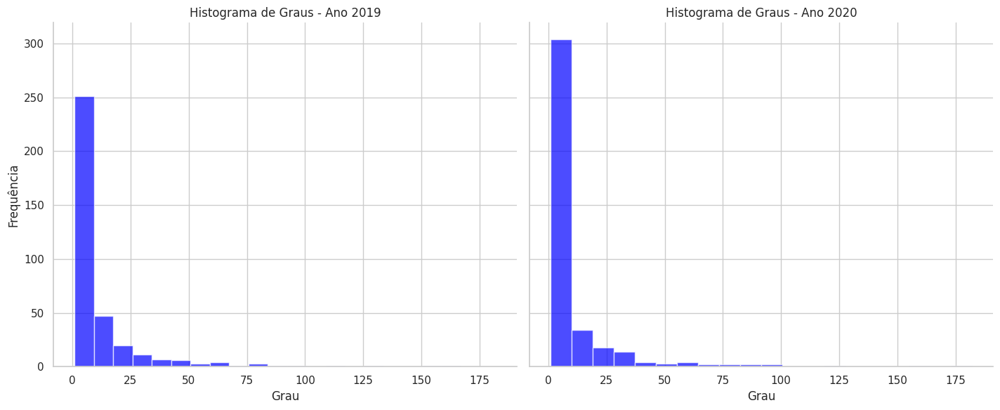

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular os graus dos nós
degrees_2019 = dict(G_2019.degree())
degrees_2020 = dict(G_2020.degree())

# Criar DataFrames para facilitar o uso com seaborn
df_2019 = pd.DataFrame({'Grau': list(degrees_2019.values()), 'Ano': '2019'})
df_2020 = pd.DataFrame({'Grau': list(degrees_2020.values()), 'Ano': '2020'})

# Combinar DataFrames
df_combined = pd.concat([df_2019, df_2020])

# Criar um grid de subplots usando seaborn
g = sns.FacetGrid(df_combined, col="Ano", height=6, aspect=1.2)
g.map(plt.hist, 'Grau', bins=20, color='blue', alpha=0.7)
g.set_axis_labels('Grau', 'Frequência')
g.set_titles('Histograma de Graus - Ano {col_name}')

# Ajustar o layout
plt.tight_layout()
plt.show()


Tabela de Distribuição de Frequência - Ano 2019:
    Grau  Frequência
0      1          47
1      2          59
2      3          37
3      4          31
4      5          21
5      6          19
6      7          16
7      8          11
8      9          10
9     10          11
10    11           9
11    12           8
12    13           5
13    14           3
14    15           3
15    16           3
16    17           5
17    18           4
18    19           2
19    20           3
20    21           3
21    22           4
22    23           1
23    24           3
24    26           2
25    27           2
26    29           1
27    31           1
28    32           2
29    33           2
30    34           1
31    36           1
32    38           1
33    39           1
34    40           1
35    41           3
36    43           1
37    45           1
38    46           1
39    47           1
40    48           1
41    50           1
42    53           1
43    54           1
44    

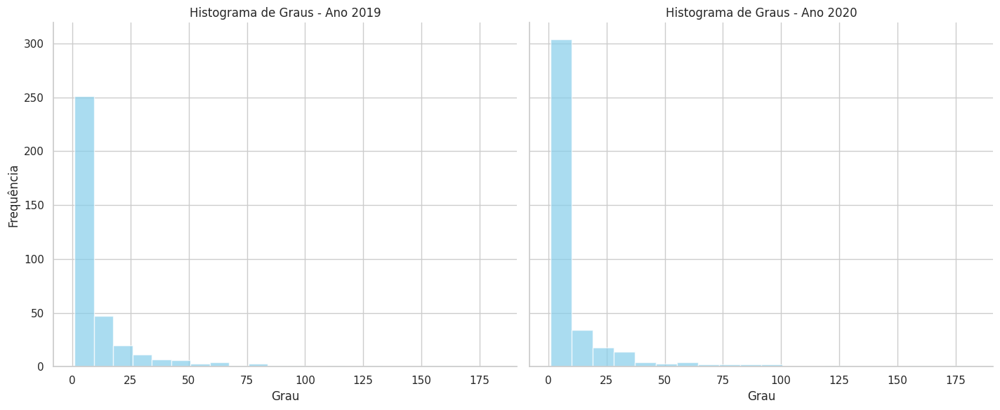

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular os graus dos nós
degrees_2019 = dict(G_2019.degree())
degrees_2020 = dict(G_2020.degree())

# Criar DataFrames para facilitar o uso com seaborn
df_2019 = pd.DataFrame({'Nó': list(degrees_2019.keys()), 'Grau': list(degrees_2019.values()), 'Ano': '2019'})
df_2020 = pd.DataFrame({'Nó': list(degrees_2020.keys()), 'Grau': list(degrees_2020.values()), 'Ano': '2020'})

# Combinar DataFrames
df_combined = pd.concat([df_2019, df_2020])

# Criar um grid de subplots usando seaborn
g = sns.FacetGrid(df_combined, col="Ano", height=6, aspect=1.2)
g.map(plt.hist, 'Grau', bins=20, color='skyblue', alpha=0.7)
g.set_axis_labels('Grau', 'Frequência')
g.set_titles('Histograma de Graus - Ano {col_name}')

# Imprimir tabela de distribuição de frequência
print("Tabela de Distribuição de Frequência - Ano 2019:")
print(df_2019.groupby('Grau').size().reset_index(name='Frequência'))

print("\nTabela de Distribuição de Frequência - Ano 2020:")
print(df_2020.groupby('Grau').size().reset_index(name='Frequência'))

# Ajustar o layout
plt.tight_layout()
plt.show()



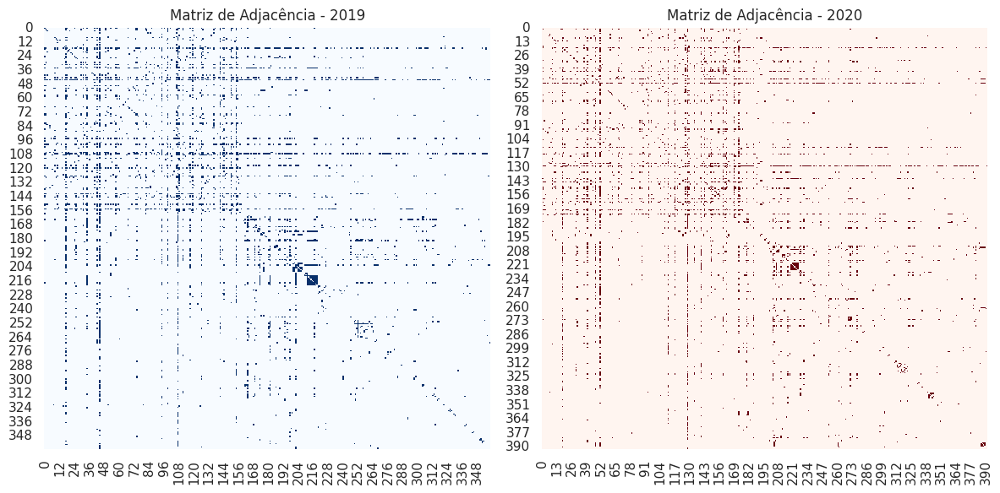

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Obter matrizes de adjacência
adj_matrix_2019 = np.array(nx.adjacency_matrix(G_2019).todense())
adj_matrix_2020 = np.array(nx.adjacency_matrix(G_2020).todense())

# Criar heatmaps
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.heatmap(adj_matrix_2019, cmap="Blues", annot=False, cbar=False)
plt.title("Matriz de Adjacência - 2019")

plt.subplot(1, 2, 2)
sns.heatmap(adj_matrix_2020, cmap="Reds", annot=False, cbar=False)
plt.title("Matriz de Adjacência - 2020")

plt.tight_layout()
plt.show()


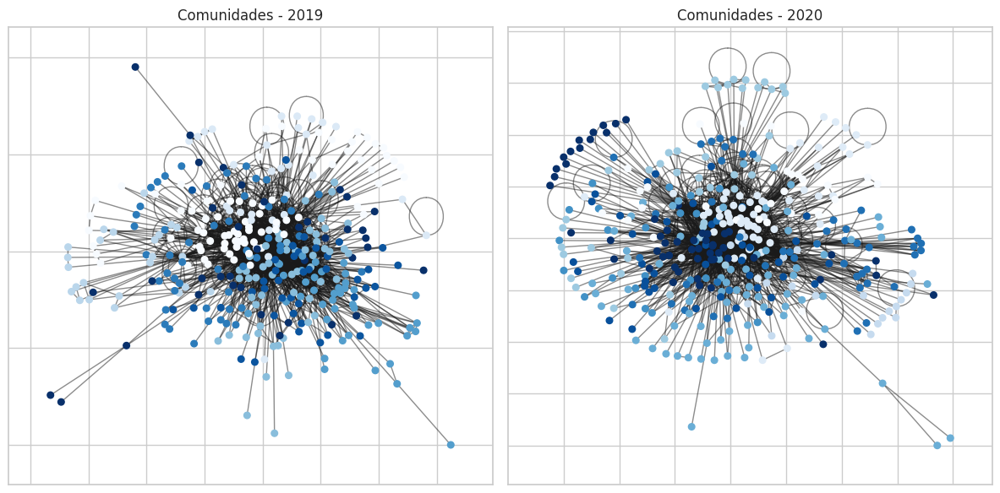

In [64]:
import community
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Aplicar algoritmo de Louvain para detecção de comunidades
partition_2019 = community.best_partition(G_2019)
partition_2020 = community.best_partition(G_2020)

# Atribuir cores às comunidades
colors_2019 = np.array(list(partition_2019.values()))
colors_2020 = np.array(list(partition_2020.values()))

# Criar layout para visualização
layout_2019 = nx.spring_layout(G_2019)
layout_2020 = nx.spring_layout(G_2020)

# Criar visualização das comunidades
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
nx.draw_networkx_nodes(G_2019, layout_2019, node_color=colors_2019, cmap=plt.cm.Blues, node_size=30)
nx.draw_networkx_edges(G_2019, layout_2019, alpha=0.5)
plt.title("Comunidades - 2019")

plt.subplot(1, 2, 2)
nx.draw_networkx_nodes(G_2020, layout_2020, node_color=colors_2020, cmap=plt.cm.Blues, node_size=30)
nx.draw_networkx_edges(G_2020, layout_2020, alpha=0.5)
plt.title("Comunidades - 2020")

plt.tight_layout()
plt.show()

In [65]:
modularity_2019 = community.modularity(partition_2019, G_2019)
modularity_2020 = community.modularity(partition_2020, G_2020)

print(f"Modularidade - 2019: {modularity_2019}")
print(f"Modularidade - 2020: {modularity_2020}")


Modularidade - 2019: 0.3517590545677636
Modularidade - 2020: 0.371458284606903


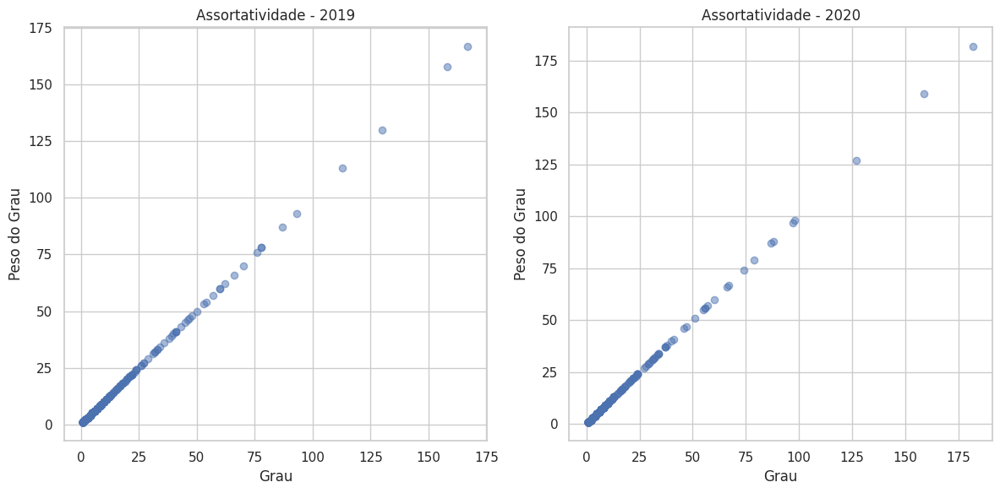

In [66]:
import matplotlib.pyplot as plt

# Obter graus dos nós
degrees_2019 = dict(G_2019.degree())
degrees_2020 = dict(G_2020.degree())

# Criar gráfico de dispersão
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(list(degrees_2019.values()), list(dict(G_2019.degree(weight='weight')).values()), alpha=0.5)
plt.title("Assortatividade - 2019")
plt.xlabel("Grau")
plt.ylabel("Peso do Grau")

plt.subplot(1, 2, 2)
plt.scatter(list(degrees_2020.values()), list(dict(G_2020.degree(weight='weight')).values()), alpha=0.5)
plt.title("Assortatividade - 2020")
plt.xlabel("Grau")
plt.ylabel("Peso do Grau")

plt.tight_layout()
plt.show()

In [67]:
# Calcular assortatividade
assortativity_2019 = nx.degree_assortativity_coefficient(G_2019)
assortativity_2020 = nx.degree_assortativity_coefficient(G_2020)

# Exibir resultados
print(f"Assortatividade - 2019: {assortativity_2019}")
print(f"Assortatividade - 2020: {assortativity_2020}")

Assortatividade - 2019: -0.28872981790279206
Assortatividade - 2020: -0.29214718043190674


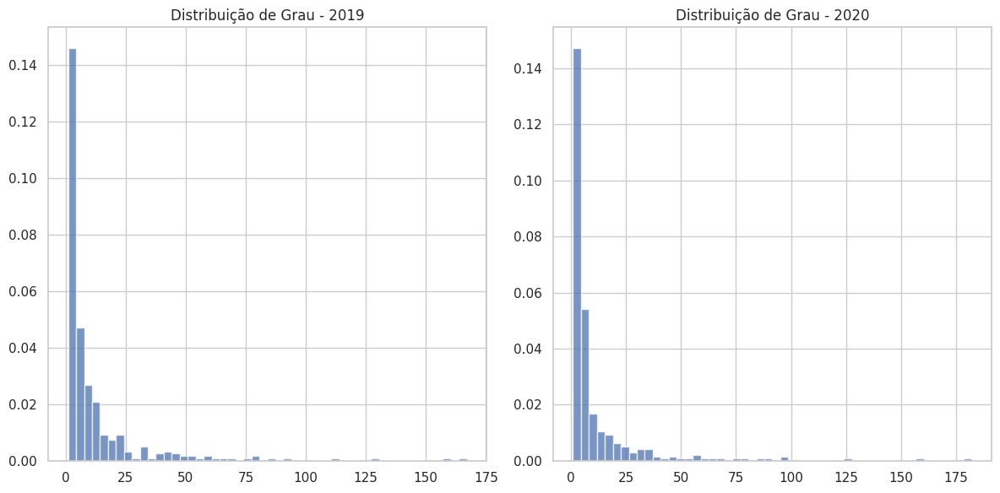

Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
2019: gamma = 2.09, p-value = 7.00
2020: gamma = 2.10, p-value = 6.00


In [68]:
import powerlaw
import matplotlib.pyplot as plt
import numpy as np

# Calcular a distribuição de grau
degree_sequence_2019 = [d for n, d in G_2019.degree()]
degree_sequence_2020 = [d for n, d in G_2020.degree()]

# Plotar o histograma da distribuição de grau
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(degree_sequence_2019, bins=50, density=True, alpha=0.75)
plt.title("Distribuição de Grau - 2019")

plt.subplot(1, 2, 2)
plt.hist(degree_sequence_2020, bins=50, density=True, alpha=0.75)
plt.title("Distribuição de Grau - 2020")

plt.tight_layout()
plt.show()

# Ajustar a lei de potência
results_2019 = powerlaw.Fit(degree_sequence_2019)
results_2020 = powerlaw.Fit(degree_sequence_2020)

# Imprimir os resultados
print("2019: gamma = %.2f, p-value = %.2f" % (results_2019.power_law.alpha, results_2019.power_law.xmin))
print("2020: gamma = %.2f, p-value = %.2f" % (results_2020.power_law.alpha, results_2020.power_law.xmin))


In [69]:
import networkx as nx

def is_bipartite(graph):
    # Usa a busca em largura para verificar se o grafo é bipartido
    try:
        _ = nx.bipartite.color(graph)
        return True
    except nx.NetworkXError:
        return False

# Verifica se G_2019 é bipartido
is_bipartite_G_2019 = is_bipartite(G_2019)

# Verifica se G_2020 é bipartido
is_bipartite_G_2020 = is_bipartite(G_2020)

# Exibe os resultados
print("G_2019 é bipartido:", is_bipartite_G_2019)
print("G_2020 é bipartido:", is_bipartite_G_2020)


G_2019 é bipartido: False
G_2020 é bipartido: False


In [70]:
import networkx as nx

def identify_graph_type(graph):
    # Verificar se o grafo é bipartido
    try:
        _ = nx.bipartite.color(graph)
        return "Bipartido"
    except nx.NetworkXError:
        pass

    # Calcular a distribuição de grau
    degree_distribution = dict(graph.degree())
    
    # Verificar se a distribuição segue uma lei de potência
    # (pode ser feita com ferramentas estatísticas como o ajuste de lei de potência)
    # Exemplo simples: verificar se a média do grau é significativamente diferente da mediana
    mean_degree = sum(degree_distribution.values()) / len(degree_distribution)
    median_degree = sorted(degree_distribution.values())[len(degree_distribution) // 2]
    
    if mean_degree > median_degree:
        return "Livre de Escala"
    
    # Aplicar algoritmo de detecção de comunidades
    communities = nx.algorithms.community.modularity_max.greedy_modularity_communities(graph)
    if len(communities) > 1:
        return "Modular"
    
    # Se não corresponder a nenhum tipo conhecido
    return "Não Identificado"

# Identificar o tipo de G_2019
type_G_2019 = identify_graph_type(G_2019)

# Identificar o tipo de G_2020
type_G_2020 = identify_graph_type(G_2020)

# Exibir resultados
print("Tipo de G_2019:", type_G_2019)
print("Tipo de G_2020:", type_G_2020)


Tipo de G_2019: Livre de Escala
Tipo de G_2020: Livre de Escala
